# Makere Passion Fruit disease detection challenge

## Problem Statement
Smallholder passion fruit farmers in Uganda face significant yield losses and economic hardship due to the prevalence of pests and diseases. These farmers often lack the necessary information and resources for timely and accurate diagnosis, leading to delayed intervention and devastating crop losses. Therefore, there is a critical need for a readily accessible, affordable, and reliable diagnostic tool that enables farmers to quickly and accurately identify passion fruit diseases in the field.

## Data collection
The data was provided by Zindi Africa

In [1]:
import pandas as pd
import numpy as np

# import data visualization
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from PIL import Image
import seaborn as sns

#Interactive plots eg zooming
from bokeh.plotting import figure
from bokeh.io import output_notebook, show, output_file
from bokeh.models import ColumnDataSource, HoverTool, Panel


# import data augmentation
import albumentations as albu

from warnings import filterwarnings
filterwarnings('ignore')

import cv2

In [2]:
train = pd.read_csv('/content/Train .csv')
test = pd.read_csv('/content/Test.csv')
sample_sub = pd.read_csv('/content/Sample_submission.csv')

In [3]:
train.shape,test.shape,sample_sub.shape

((3906, 6), (931, 1), (931, 7))

In [4]:
train.head()

,Image_ID,class,xmin,ymin,width,height
0,ID_007FAIEI,fruit_woodiness,87.0,87.5,228.0,311.0
1,ID_00G8K1V3,fruit_brownspot,97.5,17.5,245.0,354.5
2,ID_00WROUT9,fruit_brownspot,156.5,209.5,248.0,302.5
3,ID_00ZJEEK3,fruit_healthy,125.0,193.0,254.5,217.0
4,ID_018UIENR,fruit_brownspot,79.5,232.5,233.5,182.0


In [5]:
test.head()

,Image_ID
0,ID_IUJJG62B
1,ID_ZPNDRD4T
2,ID_AHFYB64P
3,ID_L8JZLNTF
4,ID_IFMUXGPL


In [6]:
sample_sub.head()

,Image_ID,class,confidence,ymin,xmin,ymax,xmax
0,ID_IUJJG62B,fruit_healthy,0.5,0.5,0.5,0.5,0.5
1,ID_ZPNDRD4T,NaN,NaN,NaN,NaN,NaN,NaN
2,ID_AHFYB64P,NaN,NaN,NaN,NaN,NaN,NaN
3,ID_L8JZLNTF,NaN,NaN,NaN,NaN,NaN,NaN
4,ID_IFMUXGPL,NaN,NaN,NaN,NaN,NaN,NaN


In [7]:
# Extracting the train files
!unzip -q /content/Train_Images.zip

In [8]:
#extracting the test files
!unzip -q /content/Test_Images.zip

**Takeaways from the data**
- the train.csv contains image ids and their bounding dimensions while the Train_images contain the image and the ids
- Our first step  will be  bounding  the iamges using the dimensions given in the train.csv

In [9]:
import os
train_images = os.listdir('/content/Train_Images')
test_images = os.listdir('/content/Test_Images')

In [10]:
train_images = pd.DataFrame(train_images,columns=['Image_ID'])
test_images = pd.DataFrame(test_images,columns=['Image_ID'])

In [11]:
train_images.shape,test_images.shape

((3002, 1), (932, 1))

In [12]:
# merging with the train.csv
train = train.merge(train_images,on='Image_ID',how='left')
test = test.merge(test_images,on='Image_ID',how='left')

## Visualization
We are going to create some reusable  functions which will help us in the ploting and visualizations.

In [13]:

# Histogram for the distribution of image attributes

def hist_hover(dataframe, column, colors=["#94c8d8", "#ea5e51"], bins=30, title=''):
    hist, edges = np.histogram(dataframe[column], bins = bins)

    hist_df = pd.DataFrame({column: hist,
                             "left": edges[:-1],
                             "right": edges[1:]})
    hist_df["interval"] = ["%d to %d" % (left, right) for left,
                           right in zip(hist_df["left"], hist_df["right"])]

    src = ColumnDataSource(hist_df)
    # Changed plot_height/plot_width to height/width
    plot = figure(height = 400, width = 600,
          title = title,
          x_axis_label = column,
          y_axis_label = "Count")
    plot.quad(bottom = 0, top = column,left = "left",
        right = "right", source = src, fill_color = colors[0],
        line_color = "#35838d", fill_alpha = 0.7,
        hover_fill_alpha = 0.7, hover_fill_color = colors[1])

    hover = HoverTool(tooltips = [('Interval', '@interval'),
                              ('Count', str("@" + column))])
    plot.add_tools(hover)

    output_notebook()
    show(plot)

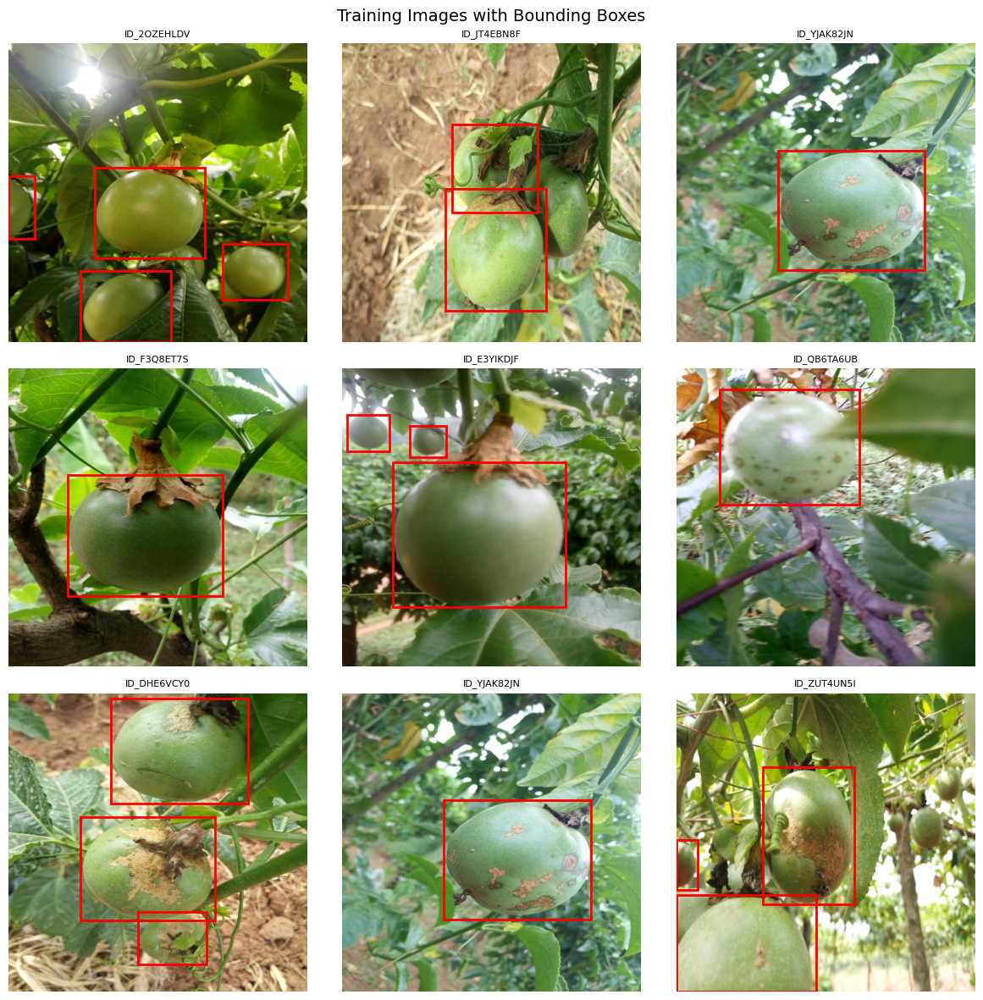

In [14]:

# visualizing images

# Define image directories
TRAIN_DIR = "/content/Train_Images"
TEST_DIR = "/content/Test_Images"

def get_all_bboxes(df, image_id):
    """Extracts all bounding boxes for a given image ID."""
    image_bboxes = df[df["Image_ID"] == image_id]
    return [(row.xmin, row.ymin, row.width, row.height) for _, row in image_bboxes.iterrows()]

def plot_image_examples(df, image_dir, rows=3, cols=3, title="Image Examples"):
    """Displays a grid of images with bounding boxes drawn."""
    fig, axs = plt.subplots(rows, cols, figsize=(12, 12))
    axs = axs.flatten()  # Flatten to easily loop over

    for ax in axs:
        idx = np.random.randint(0, len(df))  # Select a random image
        img_id = df.iloc[idx]["Image_ID"]
        img_path = os.path.join(image_dir, img_id + ".jpg")  # Construct path

        # Ensure image exists
        if not os.path.exists(img_path):
            ax.axis("off")
            continue

        # Load and display image
        img = Image.open(img_path)
        ax.imshow(img)
        ax.set_title(img_id, fontsize=8)

        # Get and draw bounding boxes
        bboxes = get_all_bboxes(df, img_id)
        for bbox in bboxes:
            rect = patches.Rectangle((bbox[0], bbox[1]), bbox[2], bbox[3],
                                     linewidth=2, edgecolor='r', facecolor='none')
            ax.add_patch(rect)

        ax.axis("off")  # Hide axes

    plt.suptitle(title, fontsize=14)
    plt.tight_layout()
    plt.show()

# Example Usage
plot_image_examples(train, TRAIN_DIR, rows=3, cols=3, title="Training Images with Bounding Boxes")


**Observations**
- some images have more than one bounding box ie more than one passion fruit
- images taken at different lighting conditions and proximity


### Bounding  boxes distribution
- In this next step we are going to count the number of bounding boxes and visualize them.The idea is to undestand  the distribution of the bounding boxes in the dataset.

In [15]:


output_notebook()  # Display Bokeh plots in Jupyter/Colab notebooks

def plot_bbox_distribution(df, title="Bounding Box Distribution"):
    """
    Plots an interactive histogram of the number of bounding boxes per image.
    """
    # Count the number of bounding boxes per image
    bbox_counts = df.groupby("Image_ID").size().values

    # Create histogram bins
    hist, edges = np.histogram(bbox_counts, bins=20)  # Adjust bins if needed

    # Create a Bokeh figure
    p = figure(title=title, x_axis_label="Number of Bounding Boxes per Image",
               y_axis_label="Frequency", tools="pan,box_zoom,reset,save")

    # Add bars to histogram
    p.quad(top=hist, bottom=0, left=edges[:-1], right=edges[1:],
           fill_color="skyblue", line_color="black", alpha=0.7)

    # Add hover tool
    hover = HoverTool(tooltips=[("Range", "@left - @right"), ("Count", "@top")])
    p.add_tools(hover)

    # Show the plot
    show(p)

# Example Usage
plot_bbox_distribution(train)


- The distribution of the bounding boxes is skewed to the right.

### Area covered by bounding boxes
- Some fruits cover larger areas compared to others and we would like to check on the distribution of the area covered.

In [16]:
# compute bounding box areas
train['bbox_area'] = train['width'] * train['height']

In [17]:
# plot a histogram of bounding box areas using our visualization code block
hist_hover(train, "bbox_area", title="Bounding Box Area Distribution")



- The  distribution is skewed to the right

In [18]:
# Maximum area of the bounding boxes
train.bbox_area.max()

189225.75

In [19]:
# minimum area of the bounding boxes
train.bbox_area.min()

1.75

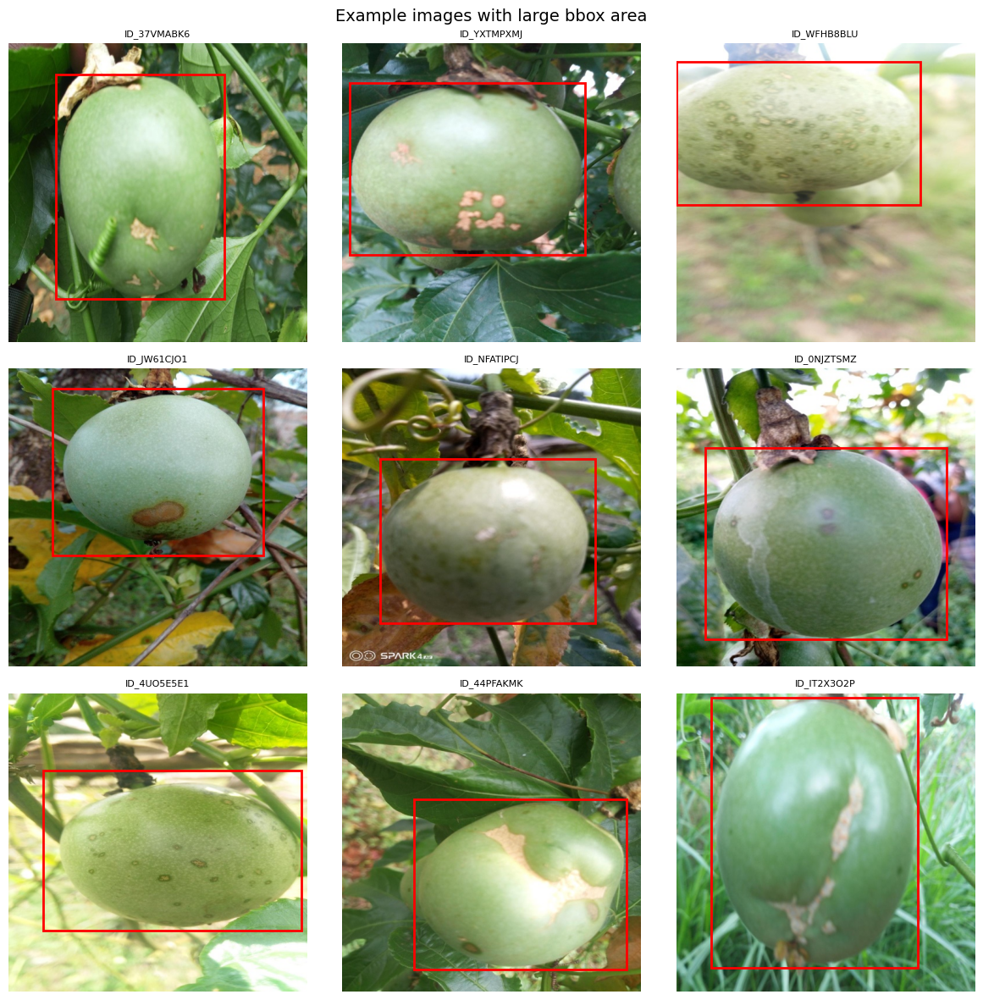

In [20]:
#Large images
large_boxes_ids = train[train['bbox_area'] > 100000].Image_ID

# filter the data for larger images
large_images_df = train[train["Image_ID"].isin(large_boxes_ids)]

plot_image_examples(large_images_df, TRAIN_DIR, rows=3, cols=3, title='Example images with large bbox area')

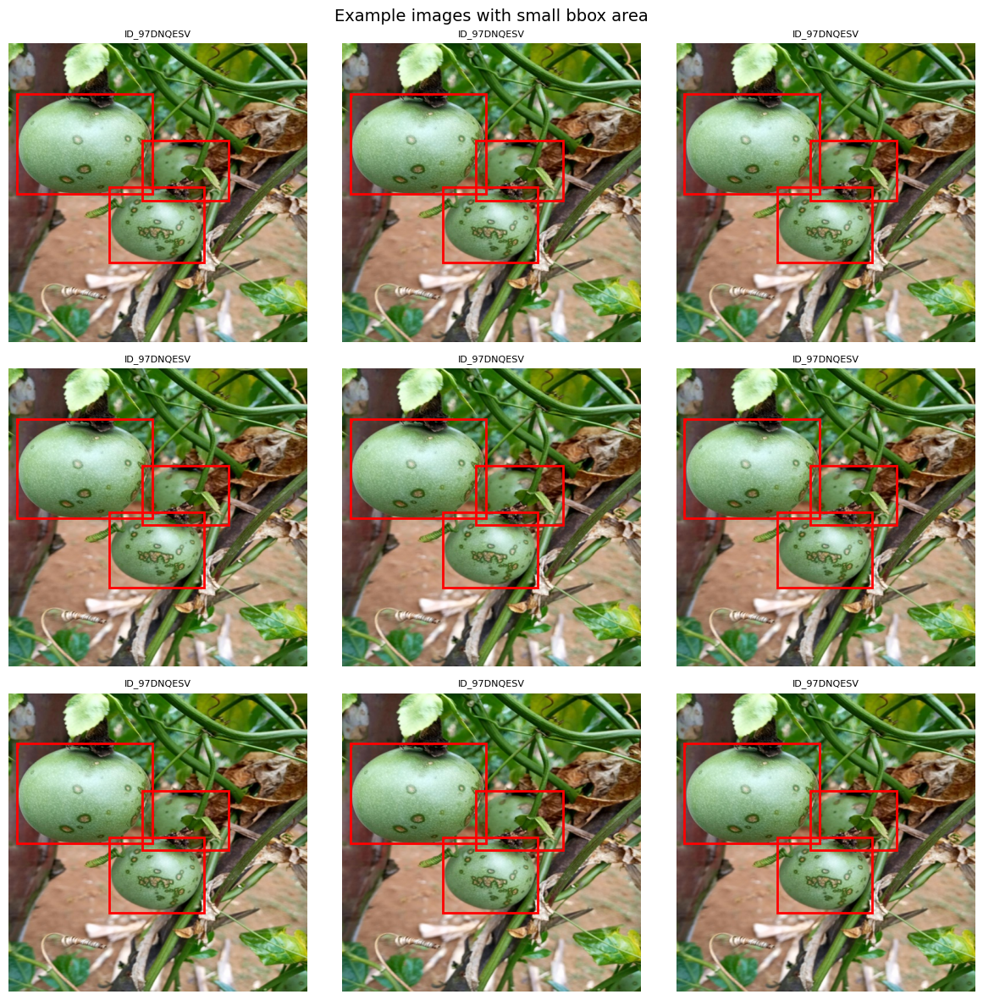

In [21]:
#small images
small_boxes_ids = train[train['bbox_area'] < 20].Image_ID

#filter the data for small images
small_images_df = train[train["Image_ID"].isin(small_boxes_ids)]

plot_image_examples(small_images_df, TRAIN_DIR, rows=3, cols=3, title='Example images with small bbox area')

In [22]:
# Compute total bounding box area per image
area_per_image = train.groupby("Image_ID", as_index=False)["bbox_area"].sum()

# Compute the percentage of the image area covered by bounding boxes
area_per_image["bbox_coverage"] = (area_per_image["bbox_area"] / (512 * 512)) * 100


In [23]:
hist_hover(area_per_image, 'bbox_area', title='Percentage of image area covered by bounding boxes')

- We can also see that the maximum is actually greater than 100%. This means that the bounding boxes are overlapping.

### Brightness of the images

In [24]:
def get_image_brightness(image_path):
    """Compute average brightness of an image (converted to grayscale)."""
    image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)
    return image.mean() if image is not None else None

def add_brightness(df, image_dir):
    """Add brightness column to the DataFrame."""
    df["brightness"] = df["Image_ID"].apply(lambda img: get_image_brightness(os.path.join(image_dir, img + ".jpg")))
    return df

# Compute brightness and plot distribution
brightness_df = add_brightness(pd.DataFrame(train["Image_ID"].unique(), columns=["Image_ID"]), "/content/Train_Images")
train = train.merge(brightness_df, on="Image_ID")
hist_hover(train, "brightness", title="Image Brightness Distribution")


- Normal distribution

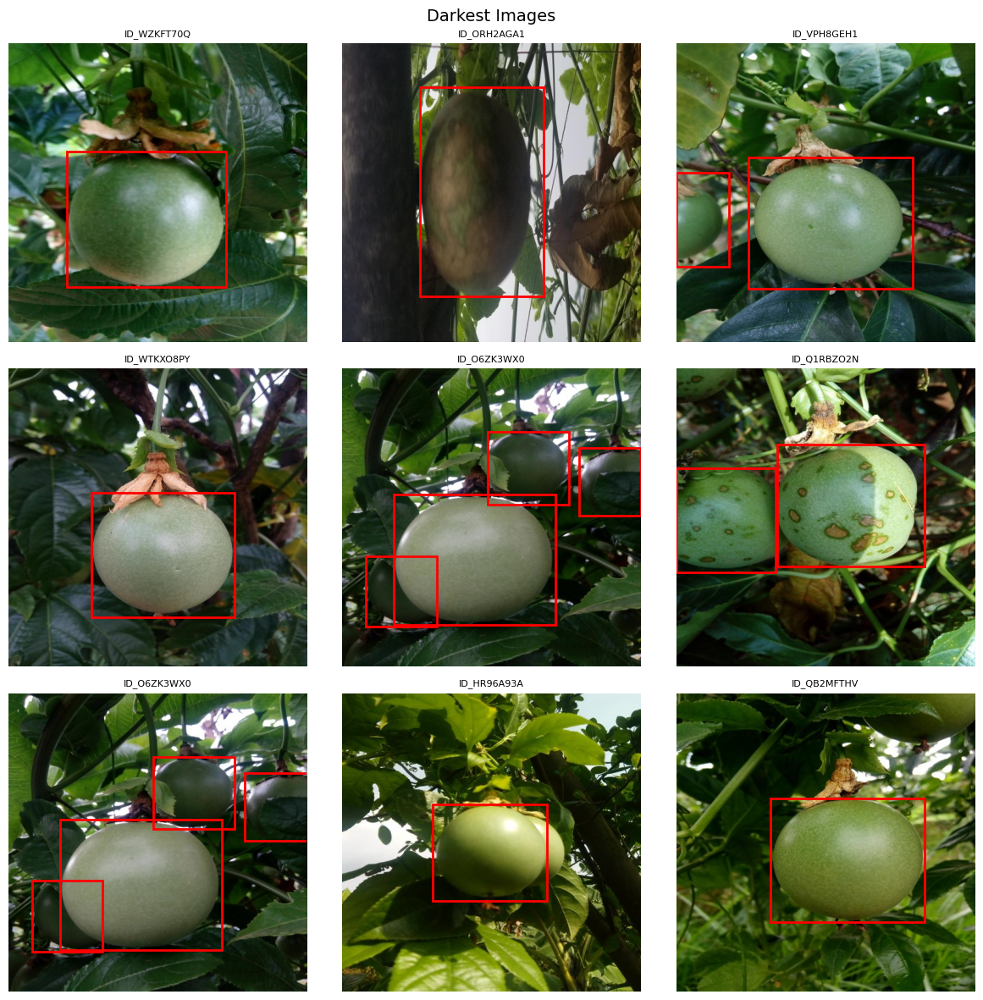

In [25]:
#Dark images
dark_im= train[train['brightness'] < 80].Image_ID


# Filter the dataset for dark images
dark_images_df = train[train["Image_ID"].isin(dark_im)]

# Call function with correct arguments
plot_image_examples(dark_images_df, TRAIN_DIR, rows=3, cols=3, title="Darkest Images")


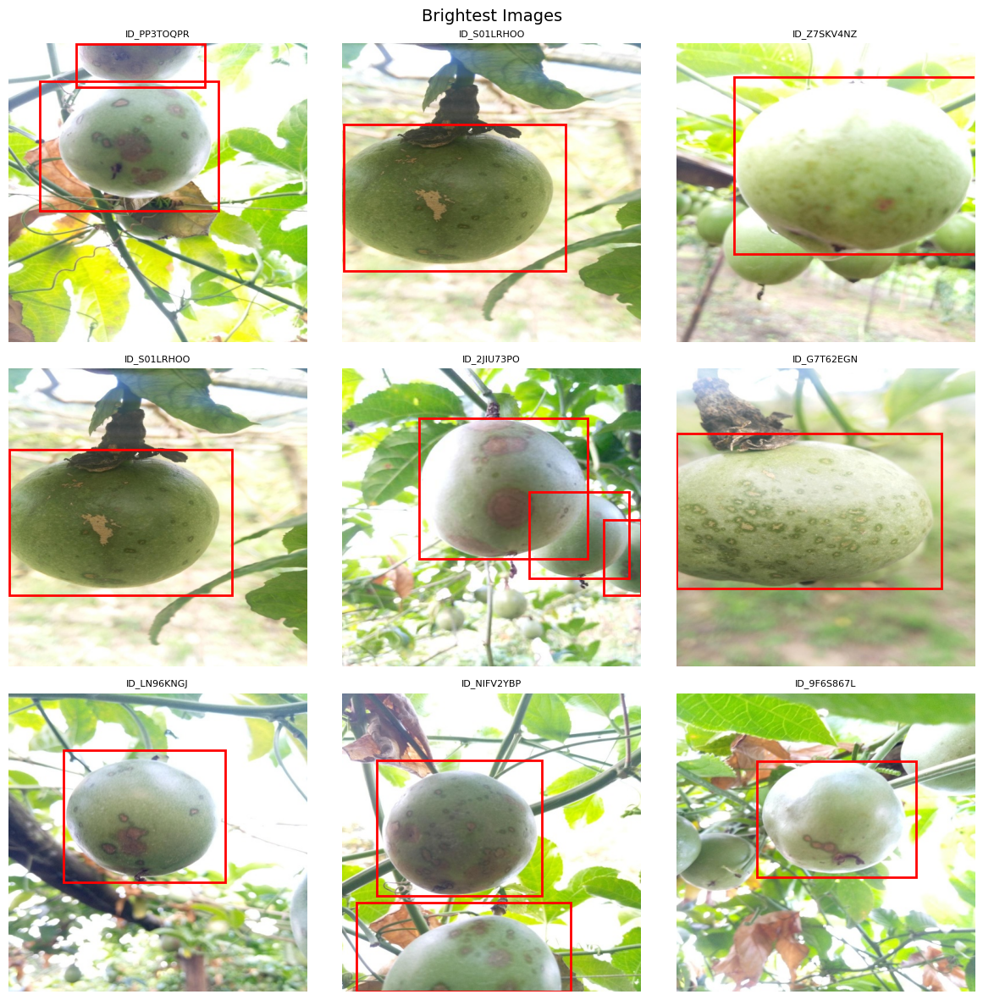

In [26]:
#brighter images
bright_im= train[train['brightness'] > 180].Image_ID

#filter the dataset for brighter images
bright_images_df = train[train["Image_ID"].isin(bright_im)]

# Call function with correct arguments
plot_image_examples(bright_images_df, TRAIN_DIR, rows=3, cols=3, title="Brightest Images")

## Comparing green to yellow colors in the fruit
I would like to plot images with different dominant colors. The idea is that the most green images will represent healthy fruits. The most yellow images and brown will represent unhealthy fruits.

### Data augmentation



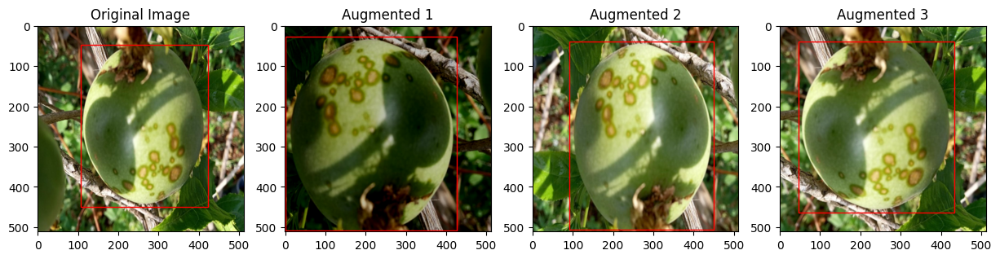

In [30]:

import albumentations.augmentations.transforms as albu_transforms

# Define a data augmentation pipeline with bounding box safety
augmentation_pipeline = albu.Compose([
    albu.RandomSizedBBoxSafeCrop(512, 512, erosion_rate=0.0, interpolation=1, p=1.0),
    albu.HorizontalFlip(p=0.5),
    albu.VerticalFlip(p=0.5),
    albu.OneOf([
        albu_transforms.RandomBrightnessContrast(),
        albu_transforms.RandomGamma(),
        albu_transforms.CLAHE()
    ], p=1.0)
], p=1.0, bbox_params=albu.BboxParams(format='coco', label_fields=['category_id']))

def augment_and_visualize(df, image_dir, transforms=augmentation_pipeline, n_augmentations=3):
    """
    Applies data augmentation to a randomly selected image and visualizes the results.
    """
    # Select a random image
    idx = np.random.randint(len(df))
    image_id = df.iloc[idx]["Image_ID"]

    # Load the image
    image_path = f"{image_dir}/{image_id}.jpg"
    image = Image.open(image_path)
    image_np = np.array(image)  # Convert to NumPy array

    # Extract bounding boxes
    bboxes = df[df["Image_ID"] == image_id][["xmin", "ymin", "width", "height"]].values.tolist()

    # Visualization setup
    fig, axs = plt.subplots(1, n_augmentations + 1, figsize=(15, 7))
    axs[0].imshow(image_np)
    axs[0].set_title("Original Image")

    # Draw original bounding boxes
    for bbox in bboxes:
        rect = patches.Rectangle((bbox[0], bbox[1]), bbox[2], bbox[3], linewidth=1, edgecolor='r', facecolor='none')
        axs[0].add_patch(rect)

    # Apply augmentations and visualize results
    for i in range(n_augmentations):
        augmented = transforms(image=image_np, bboxes=bboxes, category_id=[1] * len(bboxes))
        aug_img, aug_bboxes = augmented["image"], augmented["bboxes"]

        axs[i + 1].imshow(aug_img)
        axs[i + 1].set_title(f"Augmented {i+1}")

        for bbox in aug_bboxes:
            rect = patches.Rectangle((bbox[0], bbox[1]), bbox[2], bbox[3], linewidth=1, edgecolor='r', facecolor='none')
            axs[i + 1].add_patch(rect)

    plt.show()

# Example Usage
augment_and_visualize(train, TRAIN_DIR, n_augmentations=3)


### Target variable distribution

In [31]:
train.head()

,Image_ID,class,xmin,ymin,width,height,bbox_area,brightness
0,ID_007FAIEI,fruit_woodiness,87.0,87.5,228.0,311.0,70908.0,163.972839
1,ID_00G8K1V3,fruit_brownspot,97.5,17.5,245.0,354.5,86852.5,141.167786
2,ID_00WROUT9,fruit_brownspot,156.5,209.5,248.0,302.5,75020.0,104.635647
3,ID_00ZJEEK3,fruit_healthy,125.0,193.0,254.5,217.0,55226.5,99.280258
4,ID_018UIENR,fruit_brownspot,79.5,232.5,233.5,182.0,42497.0,106.891975


In [34]:
train['class'].value_counts()

,count
class,
fruit_healthy,1638
fruit_woodiness,1246
fruit_brownspot,1022


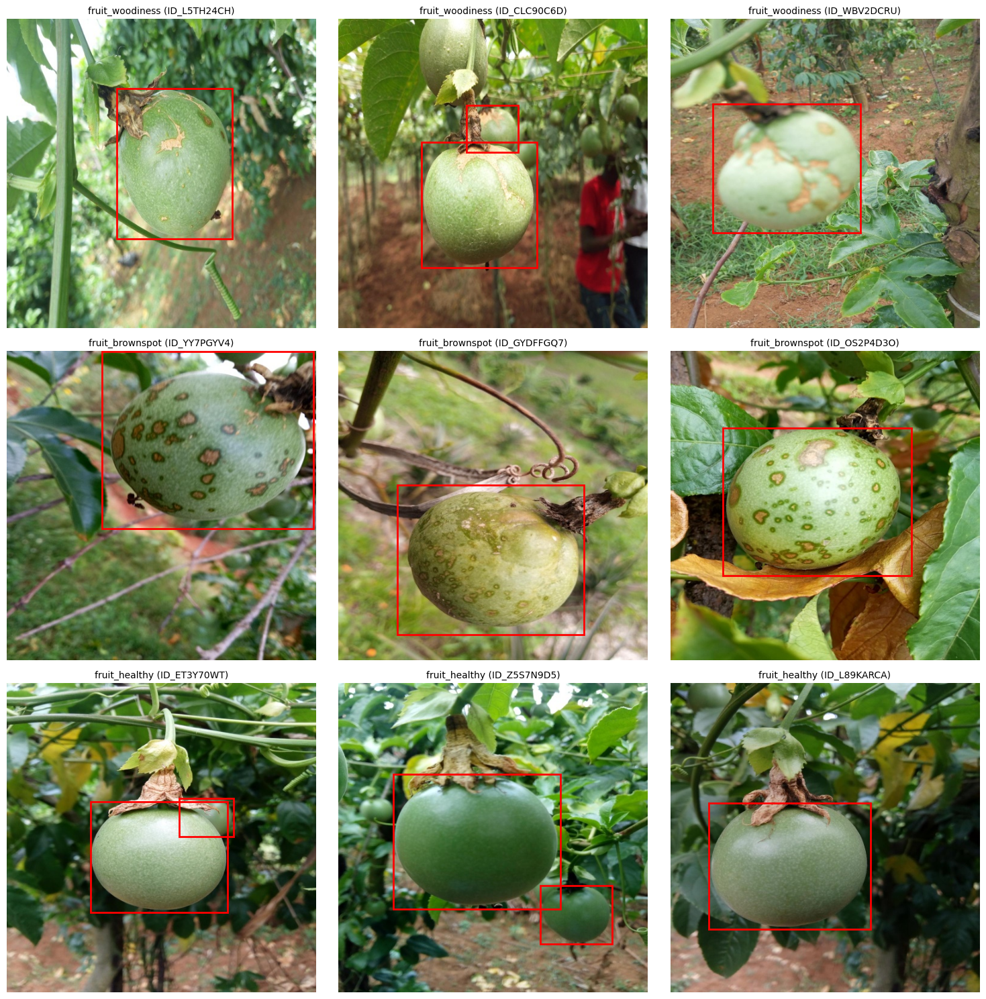

In [36]:


def visualize_multiple_per_class(df, image_dir, samples_per_class=3):
    """
    Displays multiple random images for each class in the dataset with bounding boxes.

    """
    classes = df['class'].unique()  # Get unique class labels
    num_classes = len(classes)

    fig, axs = plt.subplots(num_classes, samples_per_class, figsize=(samples_per_class * 5, num_classes * 5))

    if num_classes == 1:
        axs = [axs]  # Ensure axs is iterable if only one class exists

    for i, class_label in enumerate(classes):
        # Randomly select `samples_per_class` images from each class
        samples = df[df['class'] == class_label].sample(n=samples_per_class, random_state=42)

        for j, (_, row) in enumerate(samples.iterrows()):
            img_id = row["Image_ID"]
            img_path = f"{image_dir}/{img_id}.jpg"

            try:
                image = Image.open(img_path)
            except FileNotFoundError:
                print(f"Image {img_path} not found.")
                continue

            # Display image
            axs[i, j].imshow(image)
            axs[i, j].set_title(f"{class_label} ({img_id})", fontsize=10)

            # Get bounding boxes for the selected image
            bboxes = df[df["Image_ID"] == img_id][["xmin", "ymin", "width", "height"]].values.tolist()
            for bbox in bboxes:
                rect = patches.Rectangle((bbox[0], bbox[1]), bbox[2], bbox[3], linewidth=2, edgecolor='r', facecolor='none')
                axs[i, j].add_patch(rect)

            axs[i, j].axis("off")  # Hide axis

    plt.tight_layout()
    plt.show()

# Example Usage
visualize_multiple_per_class(train, TRAIN_DIR, samples_per_class=3)

